테스트로 불량 애호박 사진 1개로만 진행했는데
1. for 문 돌려서 전체 이미지 사이즈 변경하고,
2. 변경된 이미지로 augmentation 진행 후
3. array 로 변환하면 될 것 같아요

(혹은 폴더 전체를 변환시켜주는 법 찾기?)

그런데 https://www.tensorflow.org/tutorials/images/data_augmentation#augment_a_dataset_and_train_a_model_with_it 여기 보면 for 문으로 하나하나 변형하는듯

In [1]:
import tensorflow as tf
import PIL.Image

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 5)

import numpy as np

# 불량 애호박 판별을 위한 최소 크기

순서대로 원본이미지, 256 * 256, 128 * 128

* tensorflow로 resize 하는 법: https://www.tensorflow.org/api_docs/python/tf/image/resize 
4-D Tensor of shape [batch, height, width, channels] or 3-D Tensor of shape [height, width, channels].로 변환해야함
* 본문의 이미지 변환은 이미지 자체의 크기를 줄여서 저장하는 pillow 라이브러리 사용

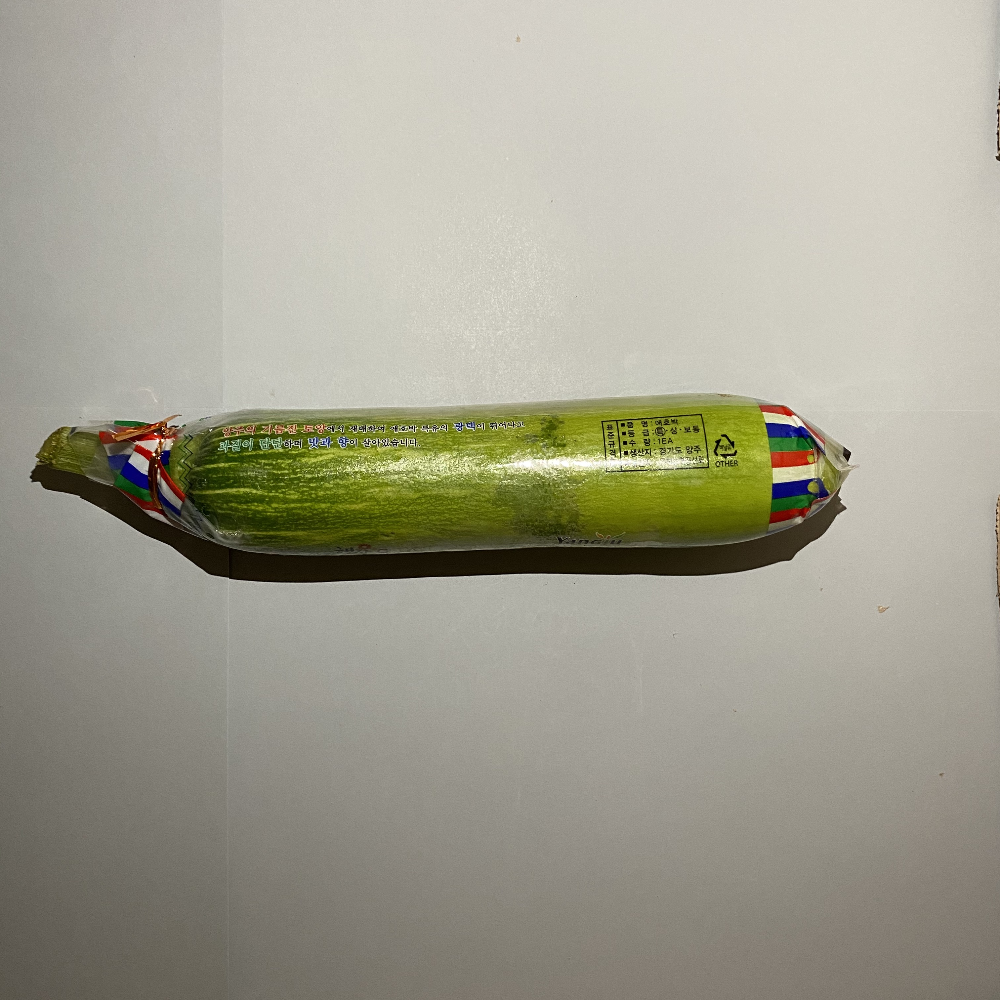

In [2]:
orgimage = PIL.Image.open("faulty.jpg")
orgimage

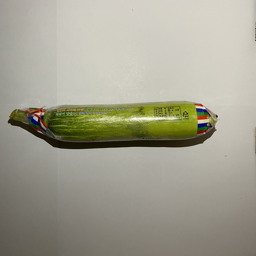

In [3]:
orgimage.resize((256,256))

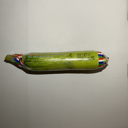

In [5]:
resized128 = orgimage.resize((128,128))
resized128

### 크기 조정된 이미지 저장

In [6]:
resized128.save("resized128.jpg", "JPEG", quality=100)

# Data augmentation

https://www.tensorflow.org/tutorials/images/data_augmentation 참고

* 다른 포맷(예를들어 numpy array 도 되는지 모르겠음) 아마 tensor 포맷으로 변환하면 되지 않을까?

* 기타 함수는 https://www.tensorflow.org/api_docs/python/tf/image 참고

In [7]:
# tensor 포맷으로 이미지 변환
image_string = tf.io.read_file("faulty.jpg")
image = tf.image.decode_jpeg(image_string,channels=3)

# 원본과 변환된 이미지 비교를 위한 함수
def visualize(original, augmented):
  fig = plt.figure()
  plt.subplot(1,2,1)
  plt.title('Original image')
  plt.imshow(original)

  plt.subplot(1,2,2)
  plt.title('Augmented image')
  plt.imshow(augmented)

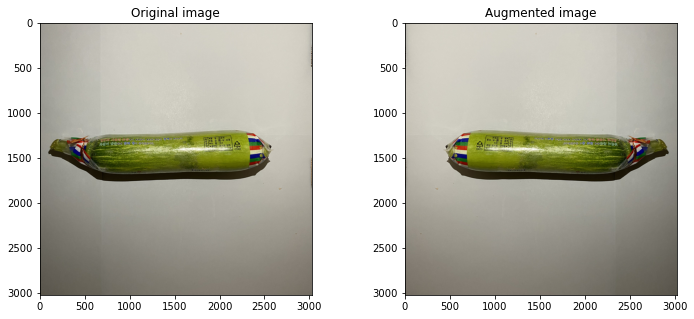

In [8]:
flipped = tf.image.flip_left_right(image)
visualize(image, flipped)

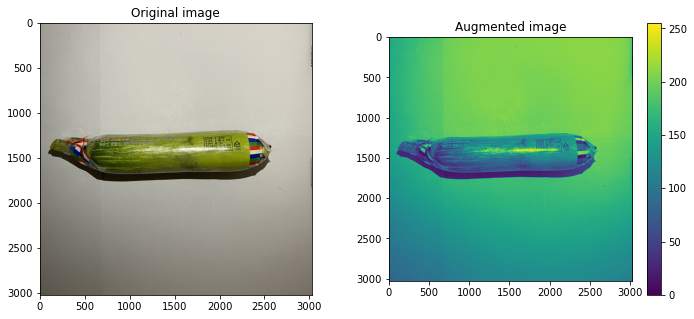

In [9]:
grayscaled = tf.image.rgb_to_grayscale(image)
visualize(image, tf.squeeze(grayscaled))
plt.colorbar()

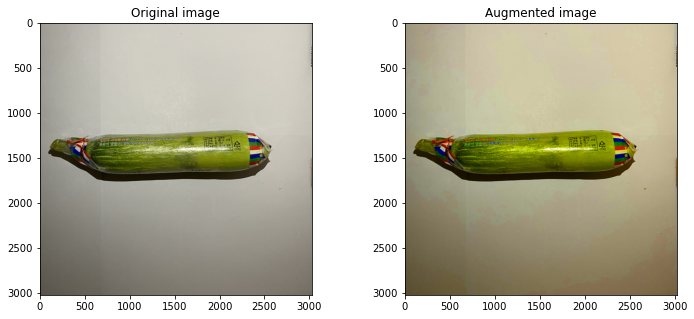

In [10]:
saturated = tf.image.adjust_saturation(image, 3)
visualize(image, saturated)

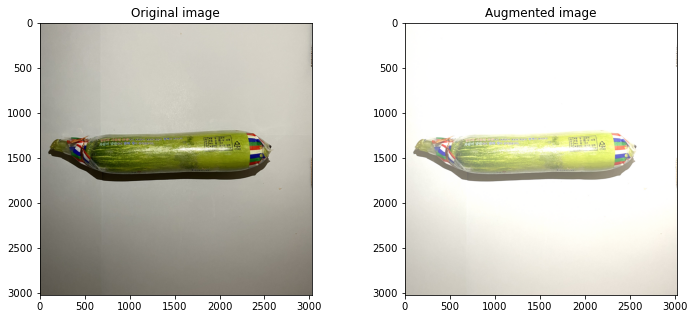

In [11]:
bright = tf.image.adjust_brightness(image, 0.4)
visualize(image, bright)

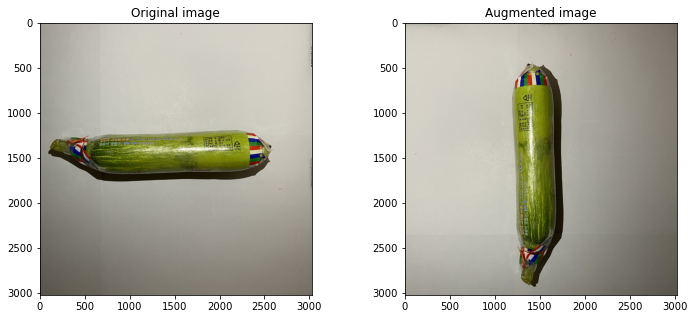

In [12]:
rotated = tf.image.rot90(image)
visualize(image, rotated)